### Preprocessing and Quality Control

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import seaborn as sns

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [2]:
plt.rcParams["figure.figsize"] = (6, 5)
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds', fontsize=10)
sc.logging.print_header()

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.1.1 scikit-learn==0.23.2 statsmodels==0.11.1 python-igraph==0.8.3 leidenalg==0.8.3


In [3]:
# replicate Meshal's pretty plotting colors
from matplotlib import colors
gray_red = colors.LinearSegmentedColormap.from_list("grouping", ["lightgray", "red", "darkred"], N = 128)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [4]:
%%time
adata = sc.read('/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/210118_curated.h5ad')

CPU times: user 31.3 s, sys: 3.04 s, total: 34.4 s
Wall time: 59.1 s


In [58]:
pd.crosstab(adata.obs.treatment_virus, adata.obs.patient)

patient,patient_1_2,patient_3,patient_4
treatment_virus,,,
BB95,0,0,1738
BB95 + sars-cov-2,0,0,2160
DMSO + sars-cov-2,0,0,2285
Gilt,0,0,1956
Gilt + sars-cov-2,0,0,1976
IFNL,0,2271,2953
IFNL + sars-cov-2,0,2249,1883
IFNa (b_d),5138,2465,2230
IFNa (b_d) + sars-cov-2,4586,1555,2530


In [32]:
# Quality control - calculate QC Metrics
adata.obs["n_counts"] = adata.X.sum(1)         # sums over rows = cells
adata.obs["n_genes"] = (adata.X > 0).sum(1)

## Human
mt_gene_mask = [gene.startswith("MT-") for gene in adata.var_names]
adata.obs["percent_mito"] = adata[:, mt_gene_mask].X.sum(1) / adata.X.sum(1)

## And also add viral percentages from the start!
adata.obs["percent_viral"] = adata.obs["viral_counts"] / adata.obs["n_counts"]

In [33]:
## Summary Statistics before Filtering
info = pd.DataFrame(data = adata.obs.patient.cat.categories, columns = ["patient"])
info["n_counts"] = adata.obs.groupby(["patient"])["n_counts"].median().values
info["n_genes"] = adata.obs.groupby(["patient"])["n_genes"].median().values
info["percent_mito"] = adata.obs.groupby(["patient"])["percent_mito"].mean().values
info["percent_viral"] = adata.obs.groupby(["patient"])["percent_viral"].mean().values
info["viral_counts"] = adata.obs.groupby(["patient"])["viral_counts"].mean().values
info["n_cells"] = adata.obs.groupby(["patient"])["n_counts"].size().values

info

,patient,n_counts,n_genes,percent_mito,percent_viral,viral_counts,n_cells
0,patient_1_2,7306.0,2145,0.034685,0.001243,3.058380,132752
1,patient_3,5055.0,1812,0.090131,0.000238,0.928506,140698
2,patient_4,4269.0,1600,0.121262,0.000346,1.049416,141047


In [34]:
## Summary Statistics before Filtering
info = pd.DataFrame(data = adata.obs.identifier.cat.categories, columns = ["identifier"])
info["n_counts"] = adata.obs.groupby(["identifier"])["n_counts"].median().values
info["n_genes"] = adata.obs.groupby(["identifier"])["n_genes"].median().values
info["percent_mito"] = adata.obs.groupby(["identifier"])["percent_mito"].mean().values
info["percent_viral"] = adata.obs.groupby(["identifier"])["percent_viral"].mean().values
info["viral_counts"] = adata.obs.groupby(["identifier"])["viral_counts"].mean().values
info["n_cells"] = adata.obs.groupby(["identifier"])["n_counts"].size().values

info

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,identifier,n_counts,n_genes,percent_mito,percent_viral,viral_counts,n_cells
0,muc21058,9324.0,2453,0.034619,0.001525,4.113530,31507
1,muc21059,6648.0,2071,0.035330,0.001204,3.063110,34210
2,muc21060,6587.0,1991,0.031526,0.001118,2.572384,34386
3,muc21061,7186.0,2089,0.037398,0.001146,2.547030,32649
4,muc21062,4656.0,1725,0.087629,0.000223,0.909091,36619
5,muc21063,5165.0,1848,0.092897,0.000201,0.673732,31422
6,muc21064,5379.5,1877,0.090963,0.000258,1.022163,36592
7,muc21065,5055.0,1803,0.089417,0.000264,1.075170,36065
8,muc22965,5014.0,1801,0.121432,0.000340,1.224682,34195
9,muc22966,3757.0,1441,0.113052,0.000373,0.948282,37105


### Quality control - plot QC Metrics

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


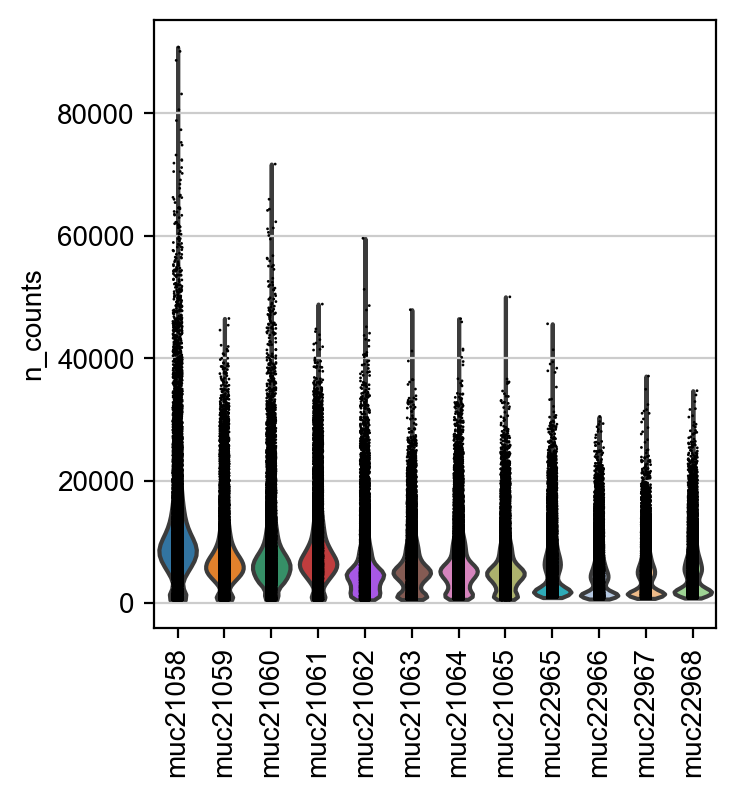

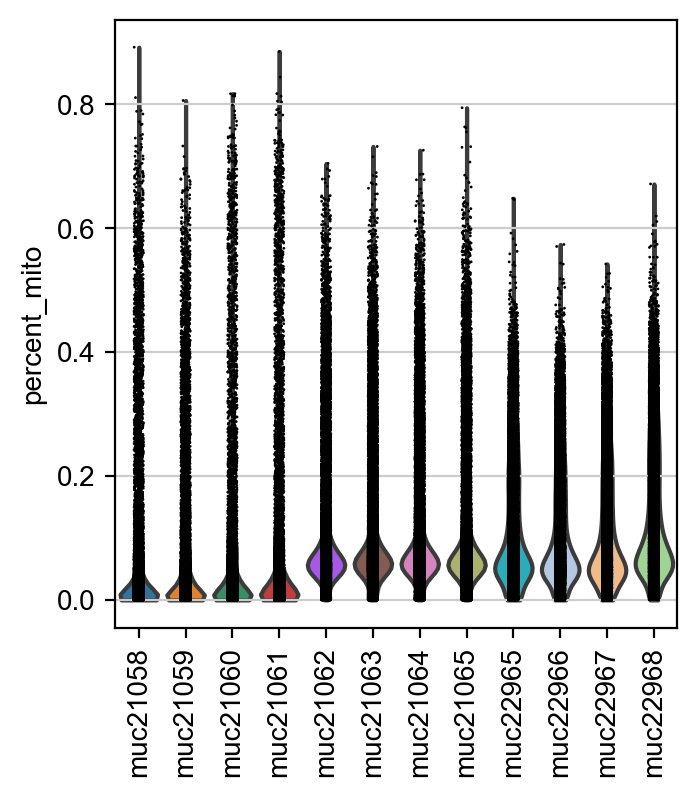

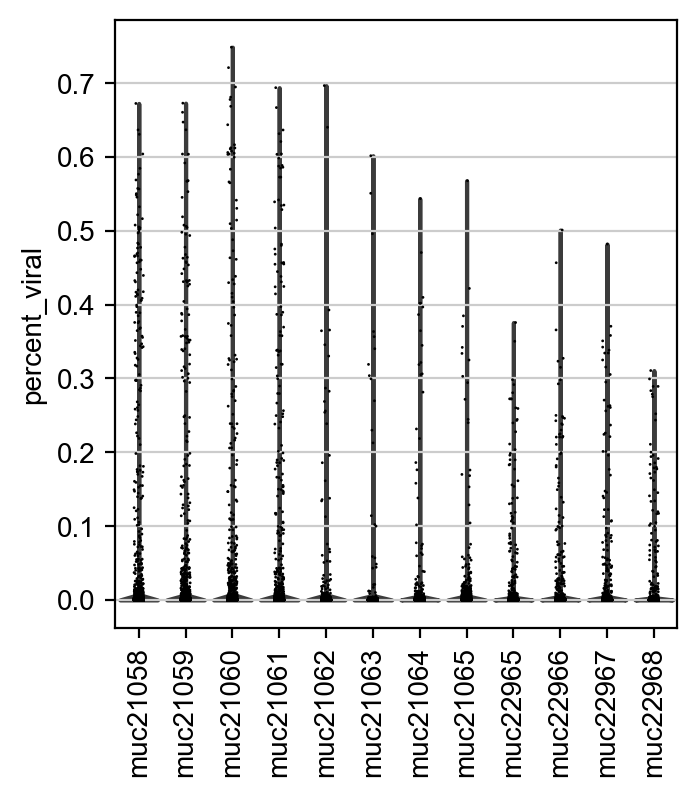

In [35]:
sc.pl.violin(adata, "n_counts", groupby = "identifier", rotation = 90)
sc.pl.violin(adata, "percent_mito", groupby = "identifier", rotation = 90)
sc.pl.violin(adata, "percent_viral", groupby = "identifier", rotation = 90)

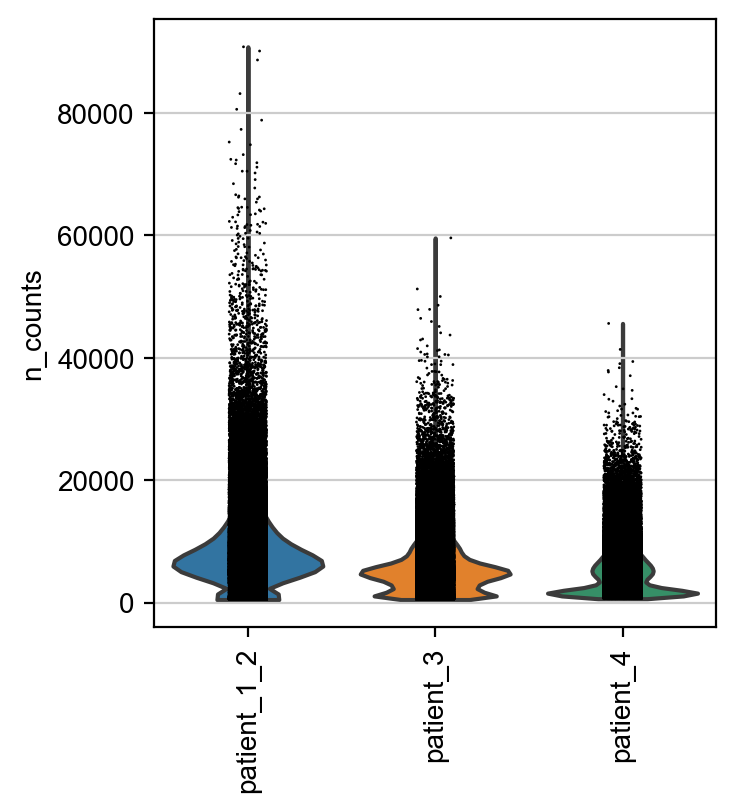

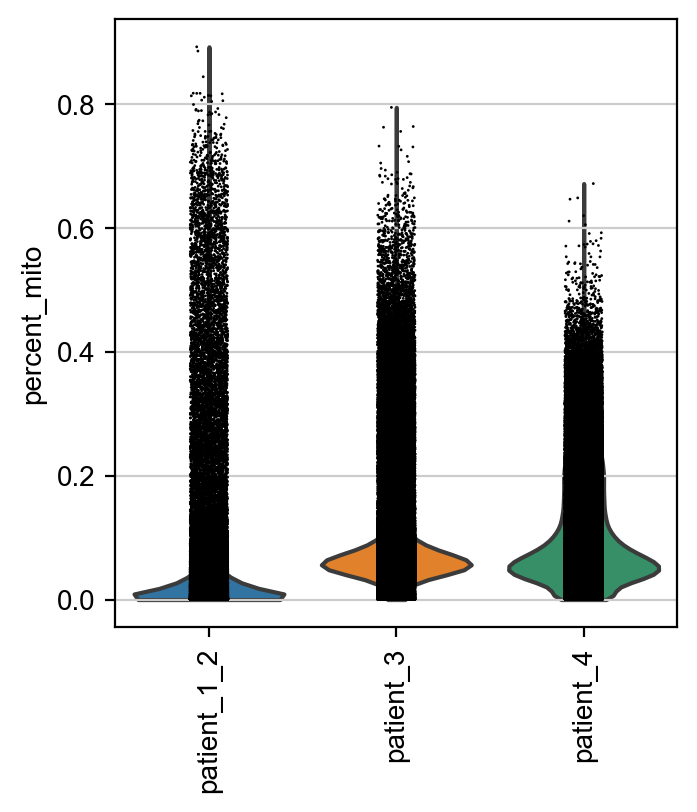

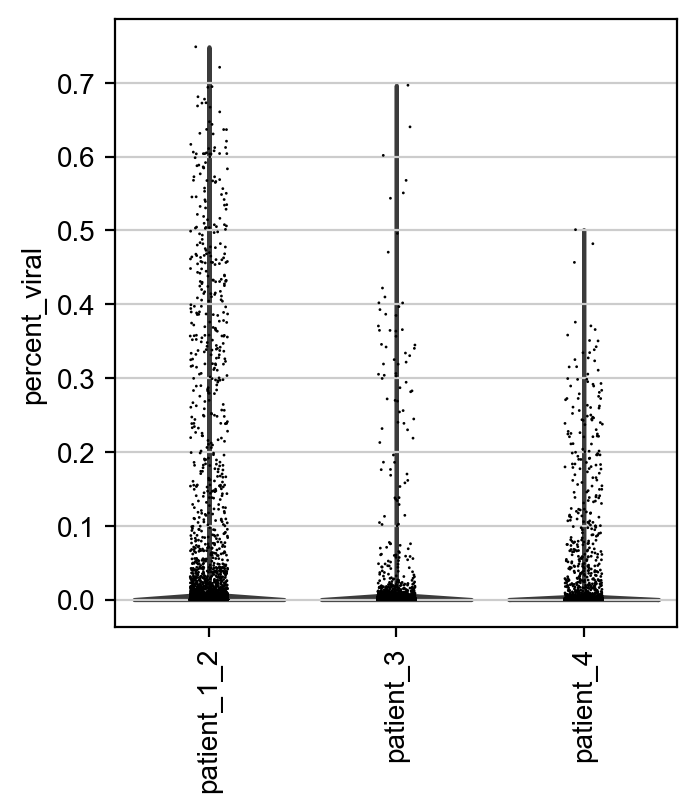

In [36]:
sc.pl.violin(adata, "n_counts", groupby = "patient", rotation = 90)
sc.pl.violin(adata, "percent_mito", groupby = "patient", rotation = 90)
sc.pl.violin(adata, "percent_viral", groupby = "patient", rotation = 90)

The samples all look fine to me...?

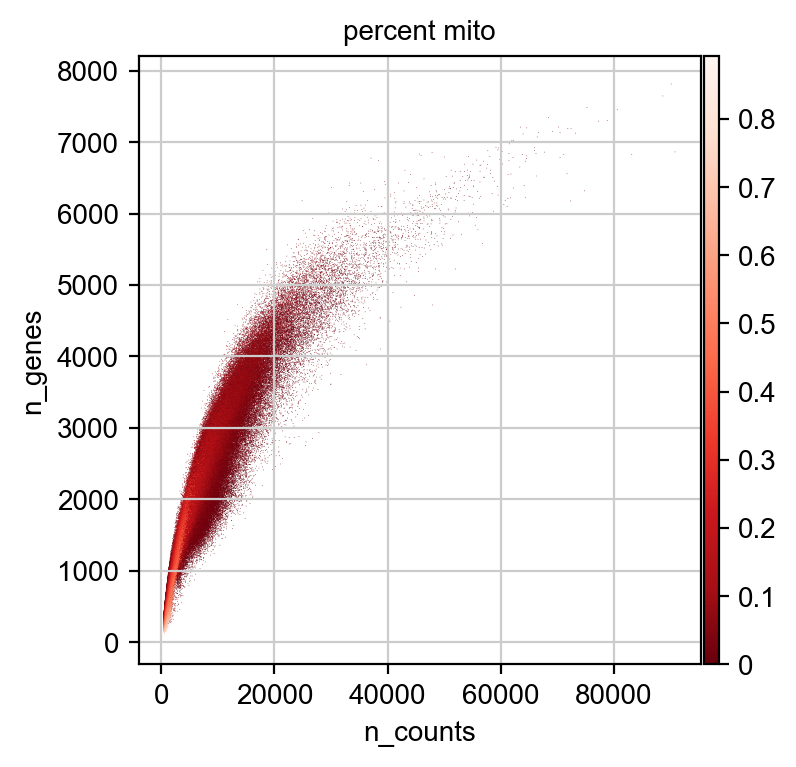

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


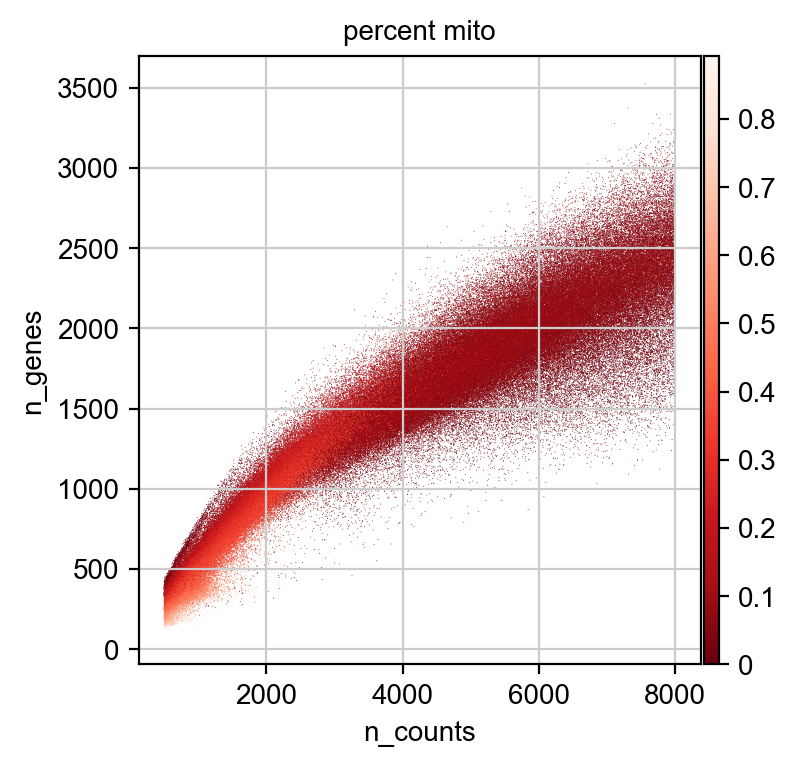

In [37]:
#Data quality summary plots
sc.pl.scatter(adata, "n_counts", "n_genes", color = "percent_mito", color_map='Reds_r')

## Zoom in to range
sc.pl.scatter(adata[adata.obs["n_counts"] < 8000],"n_counts", "n_genes", color = "percent_mito", color_map='Reds_r')

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


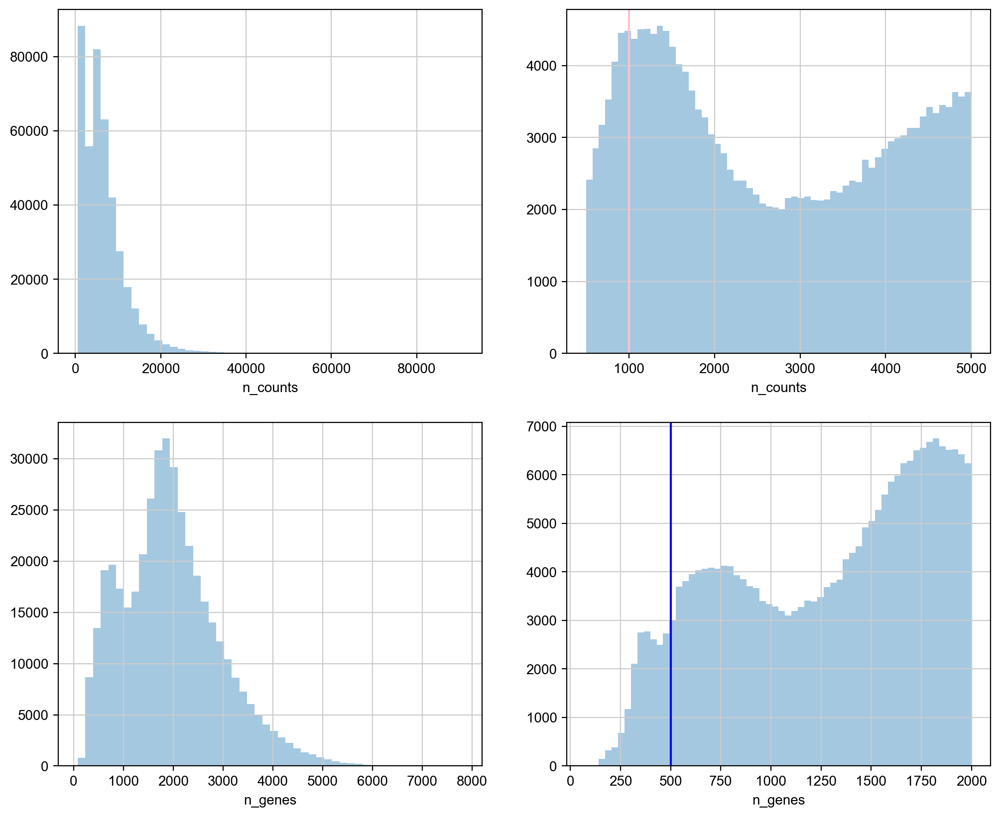

In [38]:
#Thresholding decision: counts (by default lower cut at 200 when reading in dges)
fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (12, 10))
axs = axs.ravel()

sns.distplot(adata.obs['n_counts'], kde = False, ax = axs[0])
sns.distplot(adata.obs['n_counts'][adata.obs['n_counts'] < 5000], kde = False, bins = 60, ax = axs[1])
sns.distplot(adata.obs['n_genes'], kde = False, ax = axs[2])
sns.distplot(adata.obs['n_genes'][adata.obs['n_genes'] < 2000], kde = False, bins = 60, ax = axs[3])

axs[1].axvline(1000, color = "pink") # not considered
axs[3].axvline(500, color = "blue")
plt.show()

### Actually do the Filtering for remaining QC Parameters

In [39]:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 500)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_genes(adata, min_cells = 3)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

## a higher threshold for percent mito
adata = adata[adata.obs["percent_mito"] < 0.2]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Total number of cells: 414497


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


Number of cells after max count filter: 412554
Number of cells after min count filter: 393976
Number of cells after gene filter: 393976
Number of cells after MT filter: 355499


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [40]:
## Summary Statistics after Filtering
info = pd.DataFrame(data = adata.obs.identifier.cat.categories, columns = ["identifier"])
info["n_counts"] = adata.obs.groupby(["identifier"])["n_counts"].median().values
info["n_genes"] = adata.obs.groupby(["identifier"])["n_genes"].median().values
info["percent_mito"] = adata.obs.groupby(["identifier"])["percent_mito"].mean().values
info["percent_viral"] = adata.obs.groupby(["identifier"])["percent_viral"].mean().values
info["viral_counts"] = adata.obs.groupby(["identifier"])["viral_counts"].mean().values
info["n_cells"] = adata.obs.groupby(["identifier"])["n_counts"].size().values
info

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,identifier,n_counts,n_genes,percent_mito,percent_viral,viral_counts,n_cells
0,muc21058,9491.0,2491,0.016263,0.000680,3.171216,28613
1,muc21059,6889.0,2129,0.019011,0.000588,2.413042,31912
2,muc21060,6726.0,2024,0.018212,0.000398,1.770198,32602
3,muc21061,7386.0,2131,0.019670,0.000319,1.608596,30641
4,muc21062,5000.0,1813,0.063879,0.000173,0.848817,32583
5,muc21063,5638.0,1974,0.064816,0.000185,0.705393,26941
6,muc21064,5795.0,1975,0.065792,0.000244,1.063794,32213
7,muc21065,5431.0,1898,0.064479,0.000261,1.151739,31877
8,muc22965,6374.0,2111,0.077145,0.000395,1.466652,26388
9,muc22966,4660.0,1684,0.078298,0.000391,1.099040,28847


### normalization

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


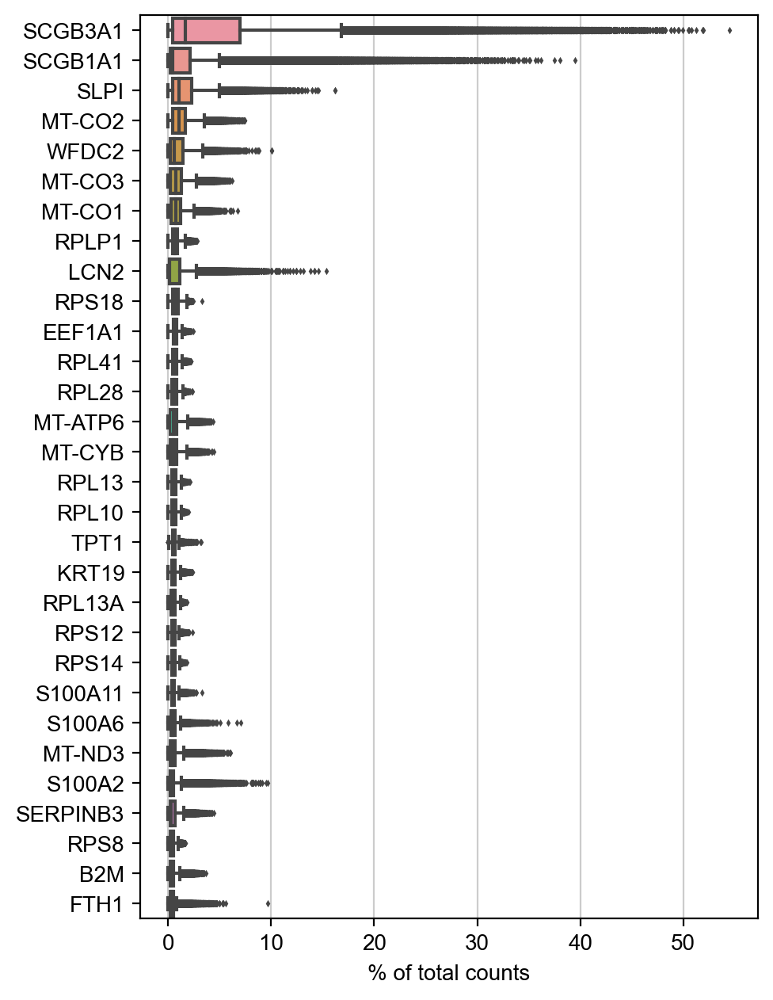

In [41]:
sc.pl.highest_expr_genes(adata)

Not sure why those are so highly expressed

In [42]:
np.max(adata.X)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


10090.0

In [43]:
%%time
import scipy
adata.layers["counts"] = scipy.sparse.csr_matrix(adata.X.copy())

CPU times: user 1.61 s, sys: 6.72 s, total: 8.33 s
Wall time: 8.36 s


In [44]:
## Normalize adata and Log Transform
sc.pp.normalize_total(adata, target_sum=4000, exclude_highly_expressed=True)
sc.pp.log1p(adata)

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [45]:
np.max(adata.X)

8.815436

In [46]:
adata

AnnData object with n_obs × n_vars = 355499 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral'
    var: 'gene_ids', 'feature_types', 'genome', 'viral', 'n_cells'
    uns: 'identifier_colors', 'patient_colors', 'log1p'
    layers: 'counts'

### Highly Variable Gene Selection

/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categoric

<AxesSubplot:>

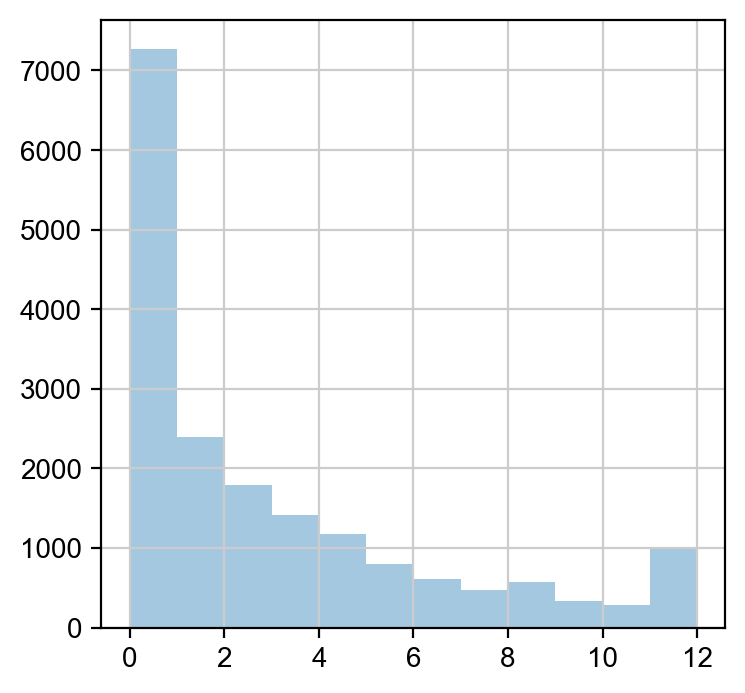

In [47]:
batch = "identifier"
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 4000, n_bins = 20, flavor = "cell_ranger", 
                                subset = False)
vartab = pd.DataFrame(adata.var["highly_variable_nbatches"], index = adata.var_names)
sns.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [48]:
thresh = 3
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print("%s Genes kept, variable in at least %s samples" %(len(hvgs), thresh))

6652 Genes kept, variable in at least 3 samples


/home/icb/yuge.ji/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


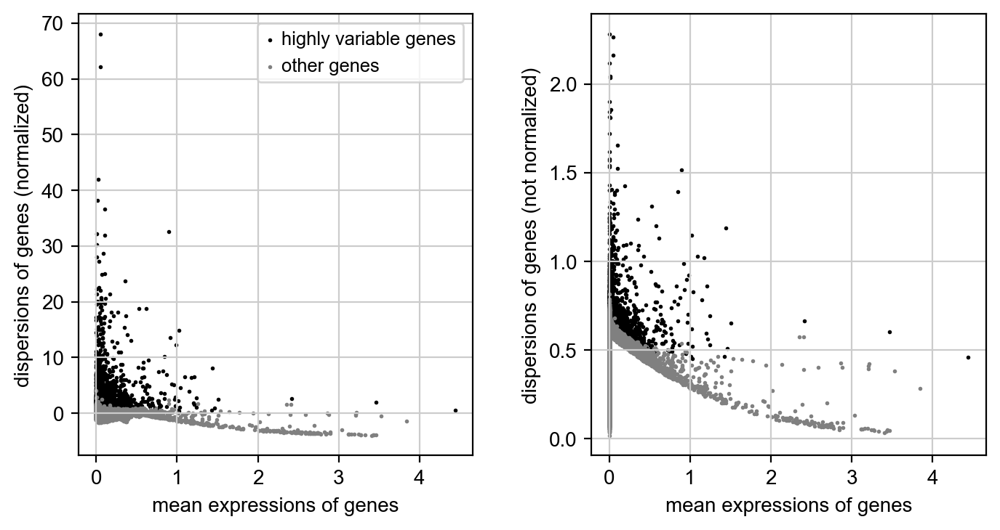

In [49]:
sc.pl.highly_variable_genes(adata)

### Remove Cell cycle Genes from list of variable genes

In [50]:
# ## Human
# cc_genes = [x.strip() for x in open("/home/agando/Documents/Meshal/PhD_Scripts/" + 
#                                     "for_orientation/regev_lab_cell_cycle_genes.txt")]

# hvgs = np.setdiff1d(hvgs, cc_genes)
adata.var["highly_variable"] = [g in hvgs for g in adata.var_names]
sum(adata.var["highly_variable"])

6652

### Calculate cell cycle Score

In [51]:
# cc_genes = [x.strip() for x in open("/home/agando/Documents/Meshal/PhD_Scripts/" + 
#                                     "for_orientation/regev_lab_cell_cycle_genes.txt")]
# s_genes = cc_genes[:43]
# g2m_genes = cc_genes[43:]
# cc_genes = np.intersect1d(adata.var_names, cc_genes)
# sc.tl.score_genes_cell_cycle(adata, s_genes = s_genes, g2m_genes = g2m_genes)

#### [ Skip Regression ]

### Visualization

In [52]:
import warnings
warnings.filterwarnings('ignore')
type(adata.X)

scipy.sparse.csr.csr_matrix

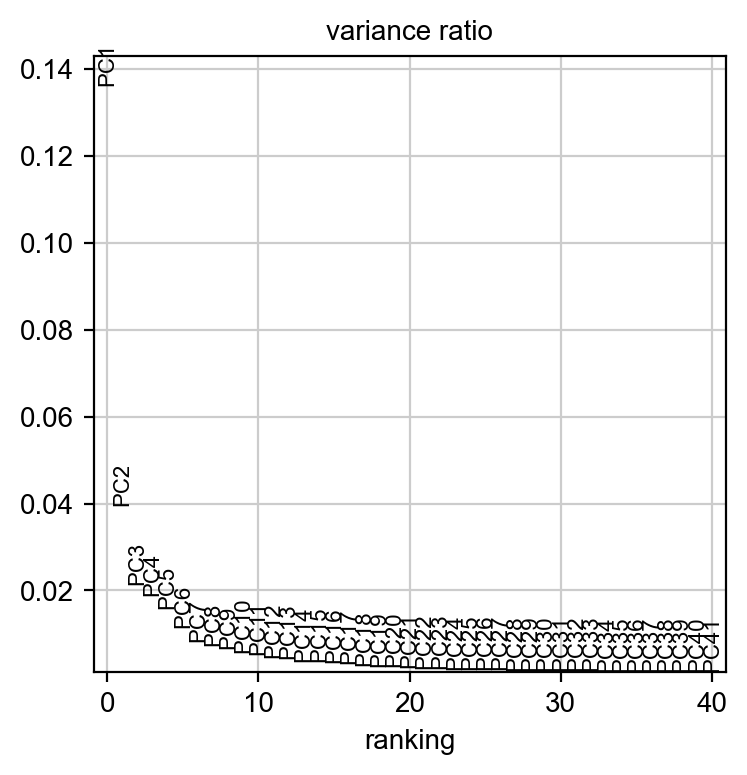

In [53]:
sc.pp.pca(adata, n_comps = 50, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs = 40)

Why do the batches mostly align when calculating neighbors with all genes, and not when calculating neighbors with highly variable genes?

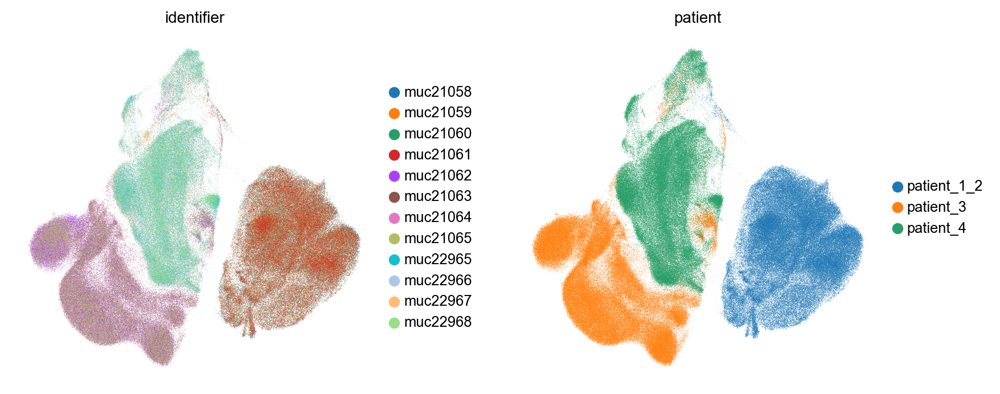

CPU times: user 23min 59s, sys: 21 s, total: 24min 20s
Wall time: 7min 32s


In [54]:
%%time
sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 10)

sc.tl.umap(adata)
sc.pl.umap(adata, color = ["identifier", "patient"], wspace = 0.25)

In [55]:
%%time
sc.tl.leiden(adata)

CPU times: user 4min 4s, sys: 2.22 s, total: 4min 6s
Wall time: 4min 7s


Save file at this point.

In [56]:
adata

AnnData object with n_obs × n_vars = 355499 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'viral', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'identifier_colors', 'patient_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [57]:
%%time
sc.write('/storage/groups/ml01/workspace/yuge.ji/covid-perturbation/data/210118_filtered', adata)

CPU times: user 4min 12s, sys: 3.86 s, total: 4min 16s
Wall time: 4min 32s


## Plotting

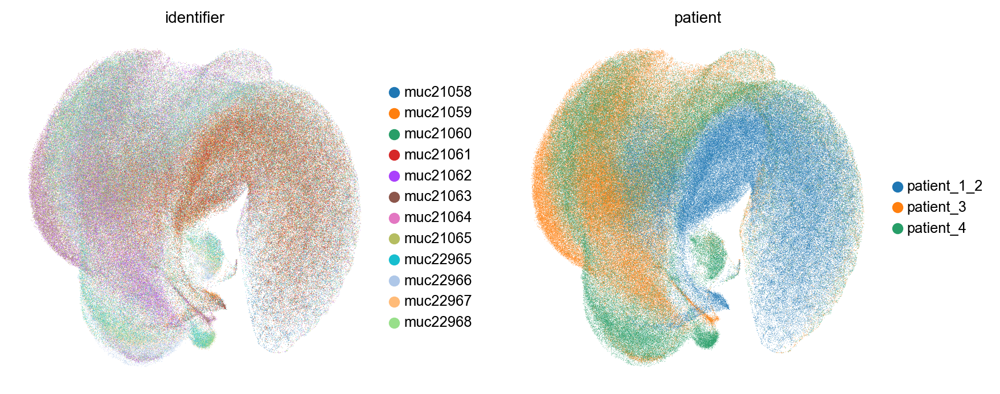

In [23]:
%%time
sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 10)

sc.tl.umap(adata)
sc.pl.umap(adata, color = ["identifier", "patient"], wspace = 0.25)

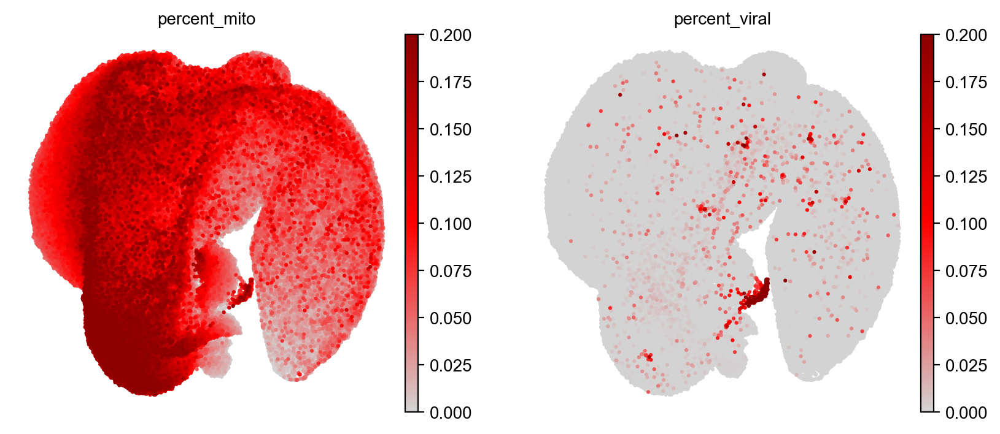

In [24]:
sc.pl.umap(adata, color = ["percent_mito", "percent_viral"], cmap = gray_red, size = 20, vmax = 0.2)

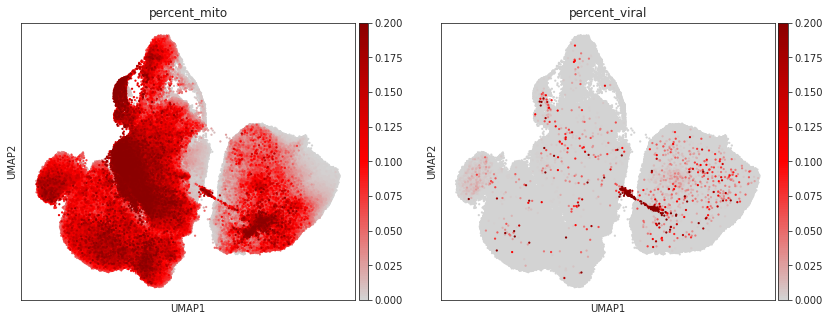

In [48]:
sc.pl.umap(adata, color = ["percent_mito", "percent_viral"], cmap = gray_red, size = 20, vmax = 0.2)

#### bbknn

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:45)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:05:02)


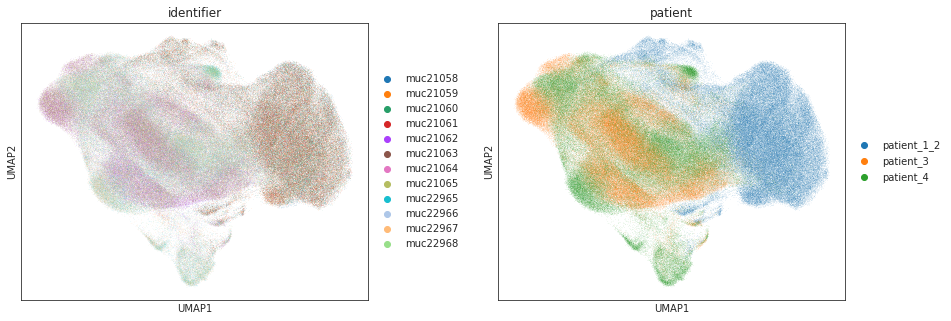

In [50]:
## Keep this one
import bbknn 
bbknn.bbknn(adata, n_pcs = 20, neighbors_within_batch = 5, batch_key = "patient")
#sc.tl.louvain(adata, resolution = 1)
#sc.tl.louvain(adata, resolution = 2, key_added = "louvain_2")

sc.tl.umap(adata)
sc.pl.umap(adata, color = ["identifier", "patient"], wspace = 0.25)

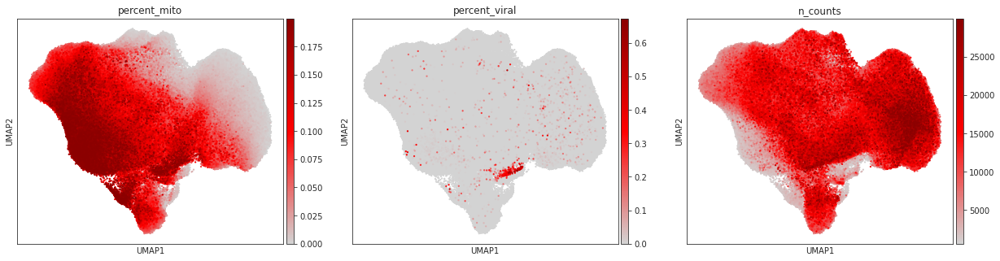

In [56]:
sc.pl.umap(adata, color = ["percent_mito", "percent_viral", "n_counts"], cmap = gray_red, size = 20)

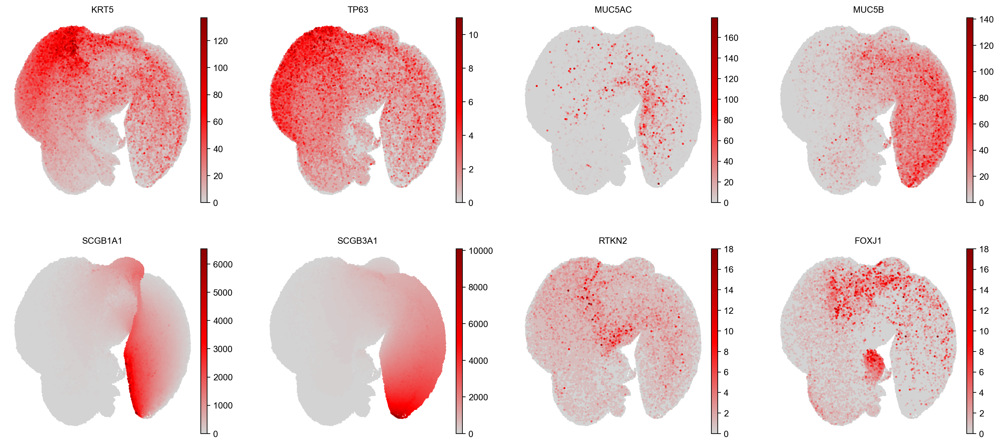

In [25]:
sc.pl.umap(adata, color = ["KRT5", "TP63", "MUC5AC", "MUC5B", "SCGB1A1", "SCGB3A1",
                           "RTKN2", "FOXJ1"], cmap = gray_red, size = 20)

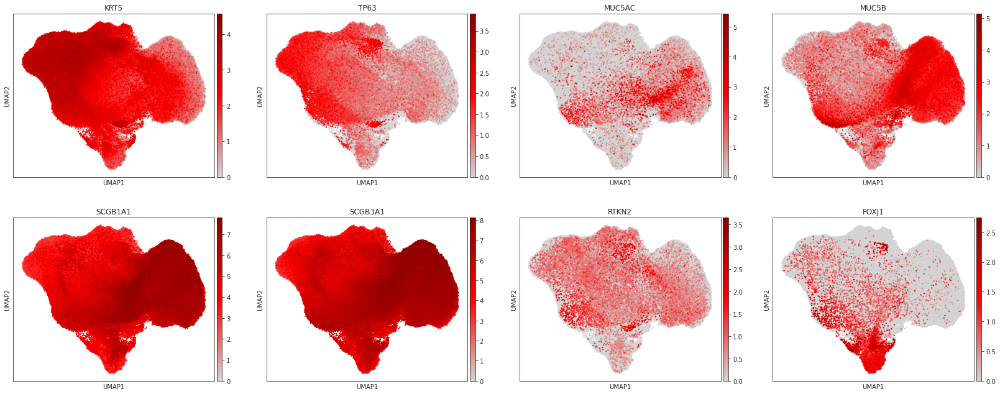

In [51]:
sc.pl.umap(adata, color = ["KRT5", "TP63", "MUC5AC", "MUC5B", "SCGB1A1", "SCGB3A1",
                           "RTKN2", "FOXJ1"], cmap = gray_red, size = 20)

### Sparsify X layer again and save object

In [54]:
from scipy import sparse
print(type(adata.X))
adata.X = sparse.csr_matrix(adata.X)
print(type(adata.X))
adata.X[20:25, 20:25].todense()

<class 'numpy.ndarray'>
<class 'scipy.sparse.csr.csr_matrix'>


matrix([[0.        , 0.        , 0.        , 0.3623782 , 0.        ],
        [0.        , 0.        , 0.        , 0.3508792 , 0.        ],
        [0.3972809 , 0.        , 0.        , 0.        , 0.        ],
        [0.38987657, 0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ]],
       dtype=float32)

In [55]:
adata.write(folder + "201206_covid19_ALI.h5ad")

### Subset to only assigned cells and recalculate PCs

In [96]:
adata = adata[-adata.obs.treatment.isin(["None", "Doublet"])].copy()
print(adata.shape)
#sc.pl.umap(adata, color = ["treatment"], size = 10)

(221974, 18115)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:05)


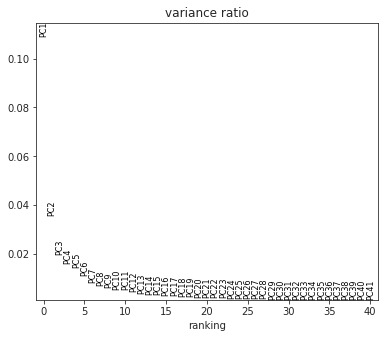

In [98]:
sc.pp.pca(adata, n_comps = 50, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs = 40)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:27)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:57)


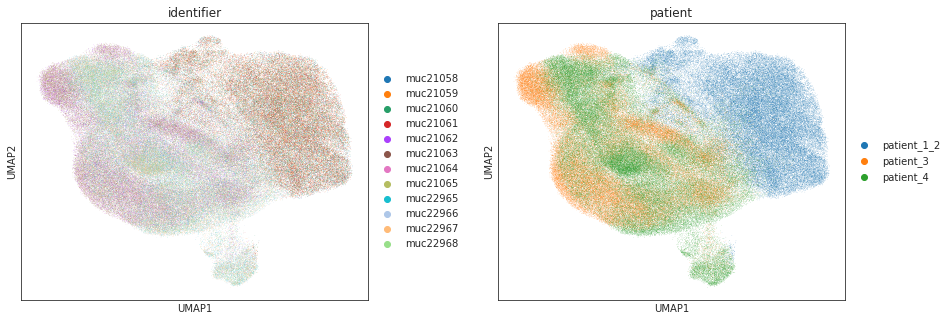

In [99]:
## Keep this one
import bbknn 
bbknn.bbknn(adata, n_pcs = 20, neighbors_within_batch = 5, batch_key = "patient")
sc.tl.umap(adata)
sc.pl.umap(adata, color = ["identifier", "patient"], wspace = 0.25)